# Prompt-Driven Image Analysis: Integrating Gen-AI for Segmentation, Object Transformation, and Cognitive Interpretation
> This system will be uniquely capable of understanding and executing tasks based on natural language inputs, simplifying complex image processing operations for users.

**Key Features:**

* **Natural Language Processing Interface:** At the heart of the system is an interface that allows users to give instructions in simple, everyday language. This makes it accessible even to those without technical expertise in image processing.

* **Advanced Image Segmentation and Transformation:** Leveraging state-of-the-art AI techniques, the system can segment images into distinct components and transform them in various ways. This includes altering image styles, merging elements from different images, and more.

* **Cognitive Analysis Capabilities:** Beyond just editing, the system is designed to perform cognitive analysis of images. This involves understanding the context, content, and potential implications or meanings behind visual elements.

**Technological Backbone:**

* **Grounding DINO by IDEA-Research:** Utilizes this model for its exceptional capability in visual grounding, enabling the system to understand and locate specific elements within an image based on textual descriptions.
> [![arXiv](https://img.shields.io/badge/arXiv-2303.05499-b31b1b.svg)](https://arxiv.org/abs/2303.05499)

* **Segment Anything by META:** Incorporates this technology for advanced segmentation tasks, allowing for precise differentiation and manipulation of various elements within an image.
> [![arXiv](https://img.shields.io/badge/arXiv-2304.02643-b31b1b.svg)](https://arxiv.org/abs/2304.02643)

* **Stable Diffusion by StabilityAI:** A key component for image transformation tasks, providing the ability to artistically alter and generate images based on the user's prompts.
> [![arXiv](https://img.shields.io/badge/arXiv-2112.10752-b31b1b.svg)](https://arxiv.org/abs/2112.10752)

* **LLaVA (Large Language-and-Vision Assistant):** Potential integration of this model to further enhance the system's understanding of the interplay between language and visual content.
> [![arXiv](https://img.shields.io/badge/arXiv-2112.10752-b31b1b.svg)](https://arxiv.org/abs/2304.08485)

> **End Goal:** To create a seamless, user-friendly platform that integrates these diverse AI models. This unified system will not only perform complex image processing tasks but also provide insights and analysis, making it a comprehensive tool for a wide range of applications, from creative industries to academic research.

## Install and Initialize Libraries

In [1]:
!pip install diffusers transformers scipy segment_anything accelerate

# Clone the specific version of the GroundingDINO repository if available
!git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd GroundingDINO

# Install GroundingDINO with dependencies
!pip install -e .

# Create a directory for weights and move into it
import os
os.makedirs('weights', exist_ok=True)
%cd weights

# Download specific versions of weights
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
!wget https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

# Return to the original directory
%cd ..


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 7.9 MB/s eta 0:00:0000:0100:01
Cloning into 'GroundingDINO'...
remote: Enumerating objects: 437, done.
remote: Counting objects: 100% (204/204), done.
remote: Compressing objects: 100% (76/76), done.
remote: Total 437 (delta 152), reused 134 (delta 128), pack-reused 233
Receiving objects: 100% (437/437), 12.86 MiB | 31.13 MiB/s, done.
Resolving deltas: 100% (224/224), done.
/kaggle/working/GroundingDINO
Obtaining file:///kaggle/working/GroundingDINO
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 426.2/426.2 kB 3.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 111.0/111.0 kB 7.9 MB/s eta 0:00:00
  Running setup.py develop for groundingdino
/kaggle/working/GroundingDINO/weights
--2024-05-13 15:02:52--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.156.201.76, 108.156.201.112, 108.156.2

In [3]:
# SAM (Segment Anything Module) imports
from segment_anything import SamPredictor, sam_model_registry

# Stable Diffusion imports
from diffusers import StableDiffusionInpaintPipeline

# GroundingDINO imports
from groundingdino.util.inference import load_model, load_image, predict, annotate
from GroundingDINO.groundingdino.util import box_ops

# Additional utility libraries
from PIL import Image
import torch
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Optional: Set device for PyTorch (if using GPU)
device = "cuda" if torch.cuda.is_available() else "cpu"


## Set Parameters

In [5]:
# Verify image path
img_path = '/kaggle/input/prompt-driven-image-analysis/demo01.png'
if not os.path.exists(img_path):
    raise FileNotFoundError(f"The specified image path {img_path} does not exist.")

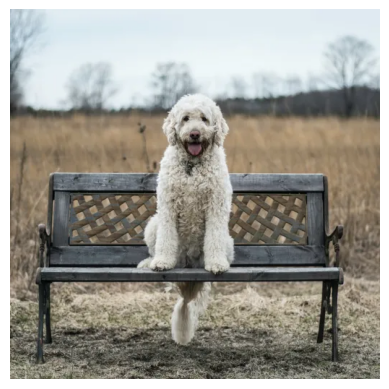

In [8]:
from PIL import Image
import matplotlib.pyplot as plt

# Read the image
img = Image.open(img_path)

# Display the image with axis hidden
plt.axis('off')
plt.imshow(img)
plt.show()

In [9]:
import torch
from PIL import Image
import os
import torchvision.transforms as transforms

# Check if CUDA is available
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load image
src, img = load_image(img_path)

# Resize image to 512x512 using transforms
desired_size = (512, 512)
resize_transform = transforms.Compose([transforms.Resize(desired_size)])
img = resize_transform(img)

# SAM Parameters
model_type = "vit_h"
sam_model_path = "./weights/sam_vit_h_4b8939.pth"
if not os.path.exists(sam_model_path):
    raise FileNotFoundError(f"The specified SAM model path {sam_model_path} does not exist.")

predictor = SamPredictor(sam_model_registry[model_type](checkpoint=sam_model_path).to(device=device))

# Stable Diffusion
pipe = StableDiffusionInpaintPipeline.from_pretrained("stabilityai/stable-diffusion-2-inpainting", torch_dtype=torch.float16).to(device)

# Grounding DINO
dino_model_config = "groundingdino/config/GroundingDINO_SwinT_OGC.py"
dino_model_weights = "weights/groundingdino_swint_ogc.pth"

if not os.path.exists(dino_model_weights):
    raise FileNotFoundError(f"The specified GroundingDINO model weights {dino_model_weights} does not exist.")

groundingdino_model = load_model(dino_model_config, dino_model_weights)

model_index.json:   0%|          | 0.00/544 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/829 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/638 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/914 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

In [12]:
# Prompt and thresholds
TEXT_PROMPT = "dog"
BOX_TRESHOLD = 0.5
TEXT_TRESHOLD = 0.35

## Utill Functions

In [13]:
import numpy as np
from PIL import Image

def show_mask(mask, image, random_color=True):
    """
    Overlays a mask on an image.

    Parameters:
    - mask (numpy array): The mask to be overlaid on the image.
    - image (numpy array): The original image.
    - random_color (bool, optional): If True, uses a random color for the mask. Defaults to True.

    Returns:
    - numpy array: The image with the mask overlay.
    """
    # Ensure mask and image dimensions are compatible
    if mask.shape[-2:] != image.shape[:2]:
        raise ValueError("Mask and image dimensions do not match.")

    # Choose mask color
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.8])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])

    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)

    # Convert to PIL images for overlaying
    annotated_frame_pil = Image.fromarray(image).convert("RGBA")
    mask_image_pil = Image.fromarray((mask_image * 255).astype(np.uint8)).convert("RGBA")

    # Return the combined image
    return np.array(Image.alpha_composite(annotated_frame_pil, mask_image_pil))

## Main Code

    """
    Makes predictions using GroundingDINO model.

    Parameters:
    - model: Pre-trained model for prediction.
    - image (torch.Tensor): Image tensor for prediction.
    - caption (str): Text prompt for prediction.
    - box_threshold (float): Threshold for bounding boxes.
    - text_threshold (float): Threshold for phrases.
    - remove_combined (bool, optional): Flag to remove combined phrases.

    Returns:
    - boxes (torch.Tensor): Predicted bounding boxes.
    - logits (torch.Tensor): Confidence for each phrase.
    - phrases (List[str]): Predicted phrases.
    """


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


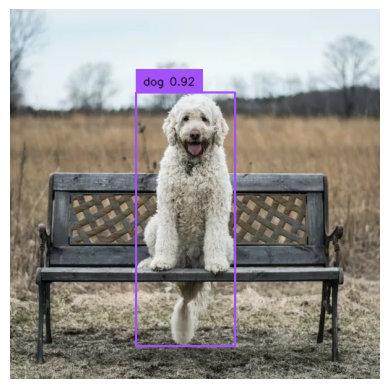

In [14]:
# Predict boxes, logits, and phrases based on the text prompt
boxes, logits, phrases = predict(
    model=groundingdino_model,
    image=img,
    caption=TEXT_PROMPT,
    box_threshold=BOX_TRESHOLD,
    text_threshold=TEXT_TRESHOLD
)

# Annotate the original image with the detected boxes and phrases
# The color channels are reversed for proper visualization
img_annnotated = annotate(image_source=src, boxes=boxes, logits=logits, phrases=phrases)[..., ::-1]

# (Optional) Visualize the annotated image
import matplotlib.pyplot as plt

plt.imshow(img_annnotated)
plt.axis('off')  # Turn off axis numbers
plt.show()


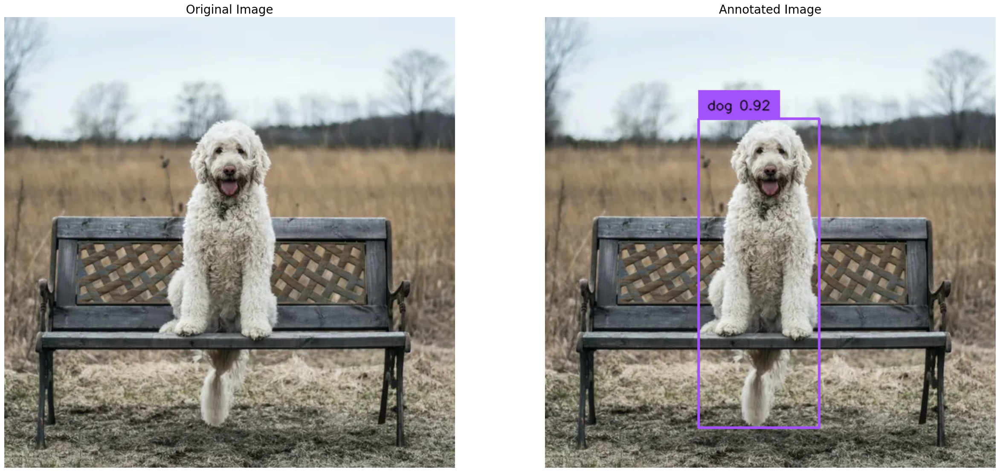

In [15]:
import matplotlib.pyplot as plt

# Create a subplot with 1 row and 2 columns, and set the figure size
fig, axes = plt.subplots(1, 2, figsize=(30, 20))

# Display the original image in the first subplot
axes[0].imshow(src)
axes[0].axis('off')  # Turn off axis numbers
axes[0].set_title("Original Image", fontsize=20)  # Title for the first image

# Display the annotated image in the second subplot
axes[1].imshow(img_annnotated)
axes[1].axis('off')  # Turn off axis numbers
axes[1].set_title("Annotated Image", fontsize=20)  # Title for the second image

# Show the plot
plt.show()


## Get Masks from Bounding Box using SAM

In [16]:
# Set the image in the SAM predictor
predictor.set_image(src)

# Get the dimensions of the source image
H, W, _ = src.shape

# Convert bounding boxes from cxcywh format to xyxy format and scale to image size
boxes_xyxy = box_ops.box_cxcywh_to_xyxy(boxes) * torch.Tensor([W, H, W, H])

# Transform bounding boxes for compatibility with SAM predictor
# and move them to the same device as the model
new_boxes = predictor.transform.apply_boxes_torch(boxes_xyxy, src.shape[:2]).to(device)


    """
    Generates masks from prompts on the set image.

    Parameters:
    - point_coords (Optional[torch.Tensor]): Point prompts in pixels.
    - point_labels (Optional[torch.Tensor]): Labels for points (1: foreground, 0: background).
    - boxes (Optional[np.ndarray]): Box prompts in XYXY format.
    - mask_input (np.ndarray): Previous mask input.
    - multimask_output (bool): Returns multiple masks for ambiguous prompts.
    - return_logits (bool): Returns mask logits instead of binary masks.

    Returns:
    - masks (torch.Tensor): Output masks in BxCxHxW format.
    - qualities (torch.Tensor): Quality predictions for each mask.
    - logits (torch.Tensor): Low-res logits for next iteration.
    """


In [17]:
try:
    # Perform segmentation to obtain masks for the specified bounding boxes
    masks, _, _ = predictor.predict_torch(
        point_coords=None,
        point_labels=None,
        boxes=new_boxes,
        multimask_output=False,
    )

    # Optional: Check the shape of the masks and visualize them
    # print(masks.shape)
    # [visualization code here]

except Exception as e:
    print(f"An error occurred during prediction: {e}")


In [18]:
try:
    # Convert the first mask to numpy array and use it in show_mask function
    mask_np = masks[0][0].cpu().numpy()
    img_annotated_mask = Image.fromarray(show_mask(mask_np, img_annnotated))

    # Resize the original image to 512x512 while maintaining aspect ratio
    original_img = Image.fromarray(src)
    original_img.thumbnail((512, 512))

    # Convert the annotated image to PIL Image
    img_annotated = Image.fromarray(img_annnotated)

    # Resize the first mask (already in numpy format) and convert to PIL Image
    only_mask = Image.fromarray(mask_np)
    only_mask.thumbnail((512, 512))

except Exception as e:
    print(f"Error processing images: {e}")

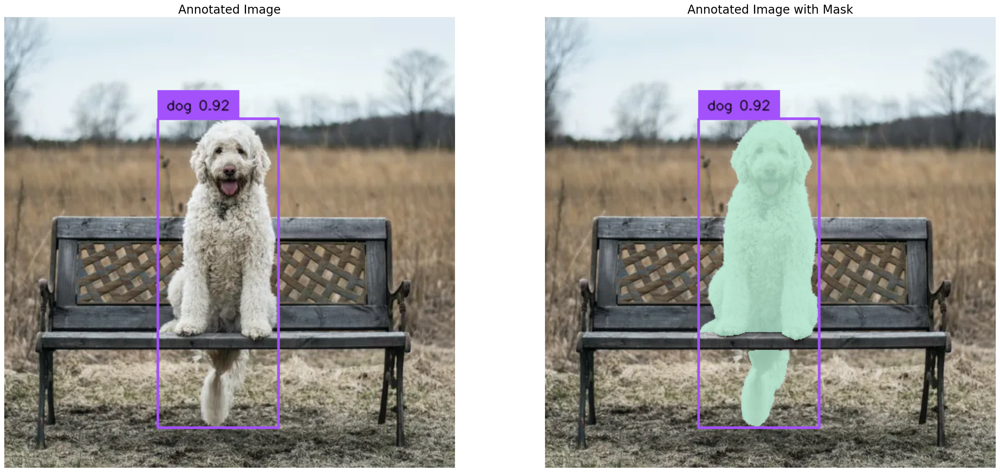

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(30, 20))

# Displaying the original annotated image in the first subplot
axes[0].imshow(img_annnotated)
axes[0].axis('off')
axes[0].set_title("Annotated Image", fontsize=20)  # Subplot title

# Displaying the annotated image with mask in the second subplot
axes[1].imshow(img_annotated_mask)
axes[1].axis('off')
axes[1].set_title("Annotated Image with Mask", fontsize=20)  # Subplot title

# Show the plot
plt.show()

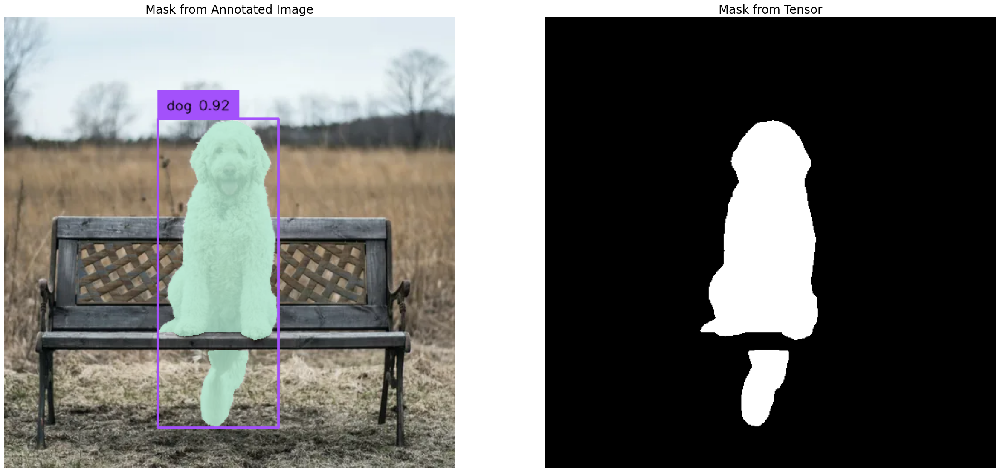

In [20]:
import matplotlib.pyplot as plt

# Create a subplot with one row and two columns, and set the figure size
fig, axes = plt.subplots(1, 2, figsize=(30, 20))

# Display the mask from 'img_annotated_mask' in the first subplot
axes[0].imshow(img_annotated_mask)
axes[0].axis('off')  # Turn off axis labels
axes[0].set_title("Mask from Annotated Image", fontsize=20)  # Subplot title

# Display the mask from the tensor in the second subplot
mask_from_tensor = Image.fromarray(masks[0][0].cpu().numpy())
axes[1].imshow(mask_from_tensor)
axes[1].axis('off')  # Turn off axis labels
axes[1].set_title("Mask from Tensor", fontsize=20)  # Subplot title

# Show the plot
plt.show()


## Target Object to Replace with Text

In [33]:
# Define the object you want to replace in the image
prompt = "dinosaur"

# Perform image inpainting using the Stable Diffusion model
# Replace the object defined by the mask in the original image
edited = pipe(prompt=prompt, image=original_img, mask_image=only_mask).images[0]

  0%|          | 0/50 [00:00<?, ?it/s]

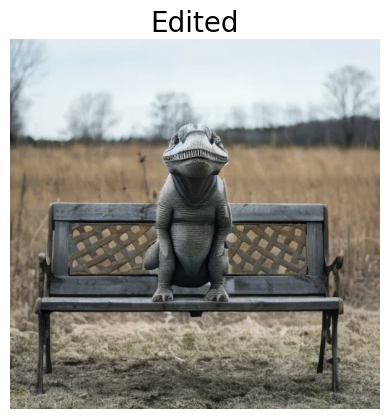

In [34]:
import matplotlib.pyplot as plt
plt.imshow(edited)
plt.title('Edited', fontdict={'fontsize': 20})
plt.axis('off')
plt.show()

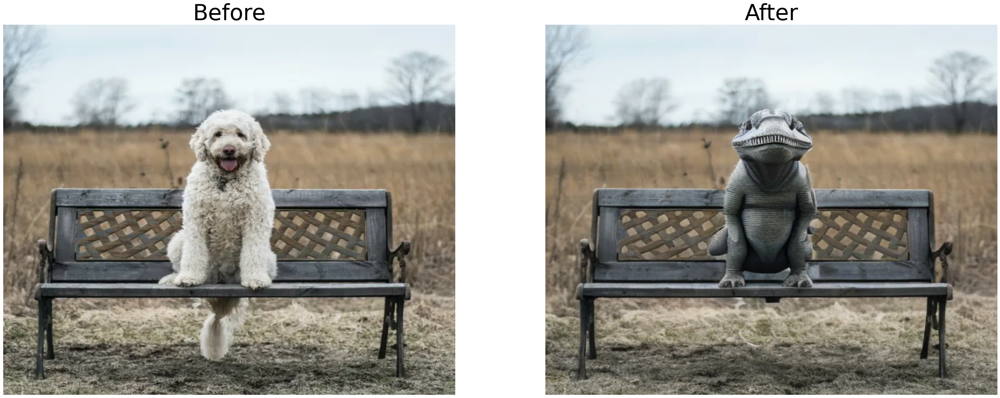

In [35]:
# Create a subplot with one row and two columns, and set the figure size
fig, axes = plt.subplots(1, 2, figsize=(40, 15))

# Display the "before" image (original) in the first subplot
axes[0].imshow(src)
axes[0].axis('off')  # Turn off axis labels
axes[0].set_title('Before', fontdict={'fontsize': 50})  # Set the title for the first subplot
axes[0].set_aspect('auto')  # Set the aspect ratio to 'auto' for natural scaling

# Display the "after" image (edited) in the second subplot
axes[1].imshow(edited)
axes[1].axis('off')  # Turn off axis labels
axes[1].set_title('After', fontdict={'fontsize': 50})  # Set the title for the second subplot
axes[1].set_aspect('auto')  # Set the aspect ratio to 'auto' for natural scaling

# Show the plot
plt.show()


# LLaVA

In [37]:
import subprocess
import pkg_resources

# Set the UTF-8 locale environment variables
import os
os.environ['LC_ALL'] = 'C.UTF-8'
os.environ['LANG'] = 'C.UTF-8'

# Check if replicate is already installed
installed_packages = {pkg.key for pkg in pkg_resources.working_set}
if 'replicate' not in installed_packages:
    subprocess.run(['pip', 'install', 'replicate'])
else:
    print('replicate is already installed.')


Processed Image:


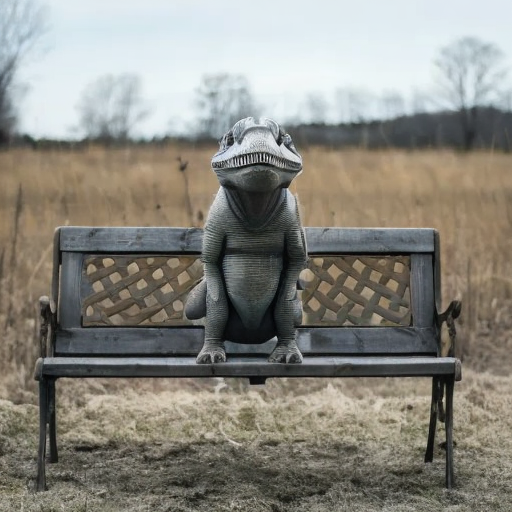

Prompt: 'Describe the image'

Description:
The image features a small, green dinosaur-like statue sitting on a wooden bench. The bench is positioned in the middle of a field, surrounded by grass. The dinosaur statue appears to be a unique and interesting addition to the scene, capturing the attention of viewers.


In [38]:
import replicate
import os
from PIL import Image
from IPython.display import display

# 'edited' is a PIL Image object
# Save the image to a file
file_path = 'output_image.jpg'  # Ensure this is the correct path
edited.save(file_path)

# Display the image being processed
print("Processed Image:")
display(edited)

# Your API token
REPLICATE_API_TOKEN = 'r8_J7sHvdn6763vDKRX8e00ZmQFPKn7b7n0oapW6'

# Create a client instance
client = replicate.Client(api_token=REPLICATE_API_TOKEN)

# Specify the prompt
prompt_text = "Describe the image"

# Run the model
output = client.run(
    ref="yorickvp/llava-13b:e272157381e2a3bf12df3a8edd1f38d1dbd736bbb7437277c8b34175f8fce358",
    input={"image": open(file_path, "rb"), "prompt": prompt_text}
)

# Formatting the output
formatted_output = ''.join(output)
formatted_description = f"Prompt: '{prompt_text}'\n\nDescription:\n{formatted_output}"

# Printing the formatted output
print(formatted_description)

# Delete the saved image file
os.remove(file_path)


# Two Images Comparison - Processing



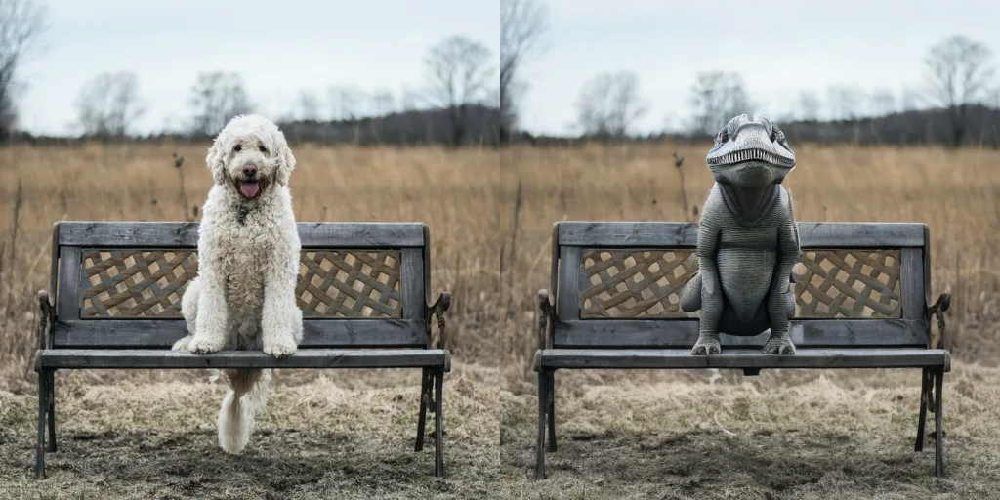

Prompt: 'explain these images':

The image consists of two side-by-side photographs featuring a dog and a crocodile sitting on a wooden bench. In the first photograph, the dog is sitting on the left side of the bench, while in the second photograph, the crocodile is sitting on the right side of the bench. The dog appears to be a large white dog, and the crocodile is a toy or a statue. The bench is placed in a grassy area, providing a natural setting for the scene.


In [39]:
import replicate
import os
import matplotlib.pyplot as plt
from PIL import Image
from IPython.display import display

# Your API token
REPLICATE_API_TOKEN = 'r8_J7sHvdn6763vDKRX8e00ZmQFPKn7b7n0oapW6'

# Create a client instance
client = replicate.Client(api_token=REPLICATE_API_TOKEN)

# Specify the prompt
prompt_text = "explain these images"

# Function to create and save a combined image of original and edited
def create_combined_image(original_img, edited, file_path):
    # Create a new image with the width being the sum of both images
    combined_width = original_img.width + edited.width
    max_height = max(original_img.height, edited.height)
    combined_img = Image.new('RGB', (combined_width, max_height))

    # Paste the two images next to each other
    combined_img.paste(original_img, (0, 0))
    combined_img.paste(edited, (original_img.width, 0))

    # Save the combined image
    combined_img.save(file_path)
    return combined_img

# Function to process an image
def process_image(file_path):
    # Run the model
    output = client.run(
        ref="yorickvp/llava-13b:e272157381e2a3bf12df3a8edd1f38d1dbd736bbb7437277c8b34175f8fce358",
        input={"image": open(file_path, "rb"), "prompt": prompt_text}
    )

    # Formatting the output
    formatted_text = ''.join(output)
    formatted_output = f"Prompt: '{prompt_text}':\n\n{formatted_text}"

    # Printing the formatted output
    print(formatted_output)

    # Delete the saved image file
    os.remove(file_path)

# Create and save the combined image
combined_file_path = 'combined_output_image.jpg'
combined_img = create_combined_image(original_img, edited, combined_file_path)

# Display the combined image
display(combined_img)

# Process the combined image
process_image(combined_file_path)
